Biscuit Classifier Overview

Key Insight:
When analyzing fragments of biscuits, the smallest circle that can enclose a broken circle fragment has a radius equal to that of the original intact circle. In contrast, the smallest enclosing circle for a broken rectangle has a radius that is half of its diagonal length, which is significantly smaller than the radius of any intact biscuit circle.

In a mixed image, the ratio of the radius of a piece to the radius of the intact circle (r_ratio) can be assessed as follows:
• For broken circles, r_ratio is typically close to 1.0 (ranging from 0.80 to 1.50).
• For broken rectangles, r_ratio is considerably lower (between 0.40 and 0.65).

Detailed Decision Process:

Benchmark Evaluation (for each image):
• Intact Circle: If the arc fraction is 0.75 or higher.
• Intact Rectangle: If the arc fraction is below 0.75 and solidity is 0.96 or higher.
• Set flags to indicate whether circles or rectangles are present.

Shape Classification (for each blob):
• If arc fraction (af) is 0.75 or more, classify as Circle (intact).
• If there are no rectangles, classify as Circle (only circles present).
• If there are no circles, classify as Rectangle (only rectangles present).
• If both shapes are present and r_ratio is 0.80 or higher, classify as Circle (enclosing radius aligns with circle benchmark).
• If both shapes are present and r_ratio is below 0.80, classify as Rectangle.

State Classification:
• For Circles: Classified as INTACT if af is 0.75 or more and size ratio is 0.75 or higher; otherwise, classified as BROKEN.
• For Rectangles: Classified as INTACT if perp ratio is 0.55 or more and size ratio is 0.65 or higher; otherwise, classified as BROKEN.



In [1]:
import os, time
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

Threshold
arc_fraction for intact circle detection
within 15% of radius -> on arc
solidity floor for intact rect detection

piece_r / bench_r >= this -> circle family (mixed images)
Gap in data: circles >= 0.715, rects <= 0.623

size_ratio (r/bench_r)^2 for intact circle
perp_ratio for intact rectangle
size_ratio (area/bench_area) for intact rectangle

In [2]:
ARC_INTACT_MIN   = 0.75   
ARC_TOLERANCE    = 0.15   
SOL_INTACT_RECT  = 0.96   

R_RATIO_CIRCLE   = 0.67   
                            # Gap in data: circles >= 0.715, rects <= 0.623

CIRCLE_SIZE_MIN  = 0.75   
RECT_PERP_MIN    = 0.55   
RECT_SIZE_MIN    = 0.65   

LINE_THRESHOLD   = 20
LINE_MIN_LEN     = 40
LINE_GAP         = 10
ANGLE_BIN        = 15
PERP_TOL         = 15
MIN_BLOB_AREA    = 5000

Masking


In [3]:
def get_paper_mask(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (7, 7), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    cnts, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return np.ones(gray.shape, np.uint8) * 255
    mask = np.zeros(gray.shape, np.uint8)
    cv2.drawContours(mask, [max(cnts, key=cv2.contourArea)], -1, 255, -1)
    return cv2.erode(mask, np.ones((20, 20), np.uint8))


def get_biscuit_mask(img, pmask):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    m   = cv2.inRange(hsv, np.array([5, 20, 30]), np.array([45, 255, 255]))
    m   = cv2.bitwise_and(m, pmask)
    return cv2.morphologyEx(m, cv2.MORPH_CLOSE, np.ones((15, 15), np.uint8))

Geometry

In [4]:
def arc_fraction(cnt):
    (cx, cy), r = cv2.minEnclosingCircle(cnt)
    if r == 0:
        return 0.0, 0.0
    pts   = cnt[:, 0, :].astype(float)
    dists = np.sqrt((pts[:, 0] - cx) ** 2 + (pts[:, 1] - cy) ** 2)
    return np.sum(np.abs(dists - r) < r * ARC_TOLERANCE) / len(pts), r


def solidity(cnt):
    hull_area = cv2.contourArea(cv2.convexHull(cnt))
    return cv2.contourArea(cnt) / hull_area if hull_area > 0 else 1.0


def perp_line_ratio(cnt, img_shape):
    blob = np.zeros(img_shape[:2], np.uint8)
    cv2.drawContours(blob, [cnt], -1, 255, 2)
    lines = cv2.HoughLinesP(blob, 1, np.pi / 180,
                             threshold=LINE_THRESHOLD,
                             minLineLength=LINE_MIN_LEN,
                             maxLineGap=LINE_GAP)
    if lines is None:
        return 0.0, 0.0
    buckets = {}
    for l in lines:
        x1, y1, x2, y2 = l[0]
        ang    = np.degrees(np.arctan2(y2 - y1, x2 - x1)) % 180
        length = np.hypot(x2 - x1, y2 - y1)
        b      = round(ang / ANGLE_BIN) * ANGLE_BIN % 180
        buckets[b] = buckets.get(b, 0.0) + length
    sorted_b         = sorted(buckets.items(), key=lambda x: -x[1])
    dom_ang, dom_len = sorted_b[0]
    perp_len         = 0.0
    for ang2, len2 in sorted_b[1:]:
        diff = min(abs(dom_ang - ang2) % 180, 180 - abs(dom_ang - ang2) % 180)
        if (90 - PERP_TOL) <= diff <= (90 + PERP_TOL):
            perp_len = len2
            break
    return dom_len, perp_len


Benchmark Pass

In [5]:
def compute_benchmarks(blobs):
    circle_radii, circle_areas, rect_areas, all_radii = [], [], [], []

    for area, cnt in blobs:
        af, r = arc_fraction(cnt)
        sol   = solidity(cnt)
        all_radii.append(r)

        if af >= ARC_INTACT_MIN:
            circle_radii.append(r)
            circle_areas.append(np.pi * r ** 2)
        elif sol >= SOL_INTACT_RECT:
            # af < ARC_INTACT_MIN is implicit — circles already caught above
            rect_areas.append(area)

    has_circles = len(circle_radii) > 0
    has_rects   = len(rect_areas)   > 0

    bench_r = (float(np.median(circle_radii)) if has_circles
               else float(max(all_radii, default=1)))

    if has_rects:
        bench_area = float(np.median(sorted(rect_areas, reverse=True)[:3]))
    elif has_circles:
        bench_area = float(np.median(circle_areas))
    else:
        bench_area = float(np.median(sorted([a for a, _ in blobs],
                                            reverse=True)[:3])) if blobs else 1.0

    return bench_r, bench_area, has_circles, has_rects


# ── Classification ───────────────────────────────────────────────────────────

def classify(cnt, bench_r, bench_area, has_circles, has_rects, img_shape):
    af, r  = arc_fraction(cnt)
    sol    = solidity(cnt)
    area   = cv2.contourArea(cnt)
    r_ratio = r / bench_r if bench_r > 0 else 0.0

    # ── Shape ──────────────────────────────────────────────────────────────
    if af >= ARC_INTACT_MIN:
        shape = "Circle"

    elif not has_rects:
        # Only circle biscuits present — all broken pieces must be circles
        shape = "Circle"

    elif not has_circles:
        # Only rectangle biscuits present — all broken pieces must be rects
        shape = "Rectangle"

    else:
        # Both types present: use enclosing-circle radius ratio.
        # A broken circle fragment came from an intact circle, so its
        # enclosing radius equals the intact circle's radius (r_ratio ~ 1.0).
        # A broken rect's enclosing radius is just half its diagonal (r_ratio << 1).
        shape = "Circle" if r_ratio >= R_RATIO_CIRCLE else "Rectangle"

    # ── State ──────────────────────────────────────────────────────────────
    if shape == "Circle":
        size_ratio = (r / bench_r) ** 2 if bench_r > 0 else 1.0
        state      = "INTACT" if (af >= ARC_INTACT_MIN and size_ratio >= CIRCLE_SIZE_MIN) else "BROKEN"
        perp_ratio = None

    else:
        size_ratio = area / bench_area if bench_area > 0 else 1.0
        dom, perp  = perp_line_ratio(cnt, img_shape)
        perp_ratio = perp / dom if dom > 0 else 0.0
        state      = "INTACT" if (perp_ratio >= RECT_PERP_MIN and size_ratio >= RECT_SIZE_MIN) else "BROKEN"

    metrics = dict(af=af, sol=sol, r_ratio=r_ratio, size=size_ratio, perp_ratio=perp_ratio)
    return shape, state, metrics


Visulaization


In [6]:
COLORS = {
    ("INTACT", "Circle"):    "#00e676",
    ("INTACT", "Rectangle"): "#69f0ae",
    ("BROKEN", "Circle"):    "#ff1744",
    ("BROKEN", "Rectangle"): "#ff6d00",
}


def draw_ghost(ax, cnt, shape, bench_r, bench_area):
    (cx, cy), _      = cv2.minEnclosingCircle(cnt)
    _, (w, h), angle = cv2.minAreaRect(cnt)
    if shape == "Circle" and bench_r > 0:
        ax.add_patch(plt.Circle((cx, cy), bench_r,
                                color='cyan', fill=False,
                                linestyle='--', linewidth=1.2, alpha=0.5))
    elif shape == "Rectangle" and bench_area > 0 and w > 0 and h > 0:
        scale = np.sqrt(bench_area / (w * h))
        ghost = ((cx, cy), (w * scale, h * scale), angle)
        box   = cv2.boxPoints(ghost).astype(int)
        pts   = np.vstack([box, box[0]])
        ax.plot(pts[:, 0], pts[:, 1],
                color='cyan', linestyle='--', linewidth=1.2, alpha=0.5)


def annotate(ax, cnt, shape, state, metrics):
    color  = COLORS[(state, shape)]
    xs, ys = cnt[:, 0, 0], cnt[:, 0, 1]
    ax.plot(xs, ys, color=color, linewidth=2.5)
    if shape == "Circle":
        detail = f"arc={metrics['af']:.2f}  r_ratio={metrics['r_ratio']:.2f}"
    else:
        pr     = metrics['perp_ratio']
        detail = f"perp={pr:.2f}  size={metrics['size']:.2f}" if pr is not None else f"size={metrics['size']:.2f}"
    ax.text(xs.mean(), ys.mean(),
            f"{state} {shape}\n{detail}",
            color='white', fontsize=7.5, fontweight='bold',
            ha='center', va='center',
            bbox=dict(facecolor=color, alpha=0.75,
                      edgecolor='none', boxstyle='round,pad=0.3'))


Main


[photo_2026-05-07_10-12-15.jpg]  bench_r=133.7  bench_area=56156  has_circles=True  has_rects=False
  INTACT Circle     af=1.000  sol=0.974  r_ratio=1.024  size=1.05
  INTACT Circle     af=1.000  sol=0.973  r_ratio=1.000  size=1.00
  INTACT Circle     af=1.000  sol=0.977  r_ratio=0.972  size=0.95
  BROKEN Circle     af=0.720  sol=0.937  r_ratio=1.074  size=1.15
  BROKEN Circle     af=0.710  sol=0.952  r_ratio=0.970  size=0.94
  BROKEN Circle     af=0.317  sol=0.942  r_ratio=0.982  size=0.96
  BROKEN Circle     af=0.298  sol=0.922  r_ratio=0.966  size=0.93


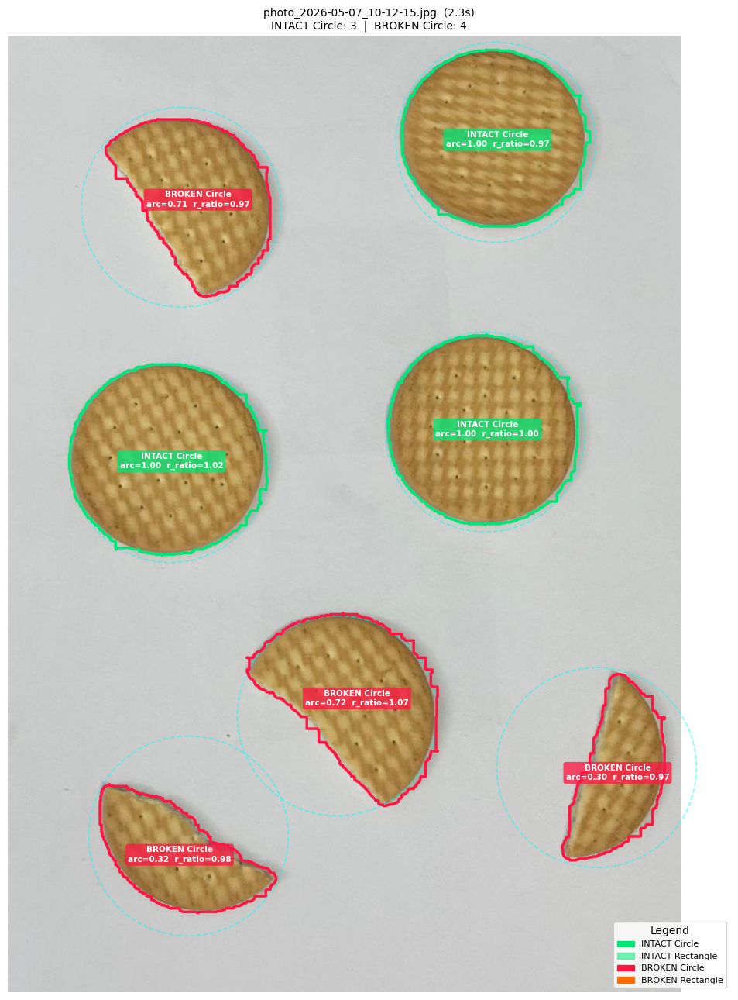


[photo_2026-05-07_10-12-19.jpg]  bench_r=126.6  bench_area=29468  has_circles=True  has_rects=True
  INTACT Circle     af=1.000  sol=0.985  r_ratio=1.018  size=1.04
  INTACT Circle     af=1.000  sol=0.980  r_ratio=0.998  size=1.00
  INTACT Circle     af=1.000  sol=0.985  r_ratio=1.000  size=1.00
  BROKEN Circle     af=0.737  sol=0.943  r_ratio=1.061  size=1.12
  BROKEN Circle     af=0.702  sol=0.966  r_ratio=0.968  size=0.94
  BROKEN Circle     af=0.303  sol=0.954  r_ratio=0.991  size=0.98
  BROKEN Circle     af=0.266  sol=0.923  r_ratio=0.978  size=0.96


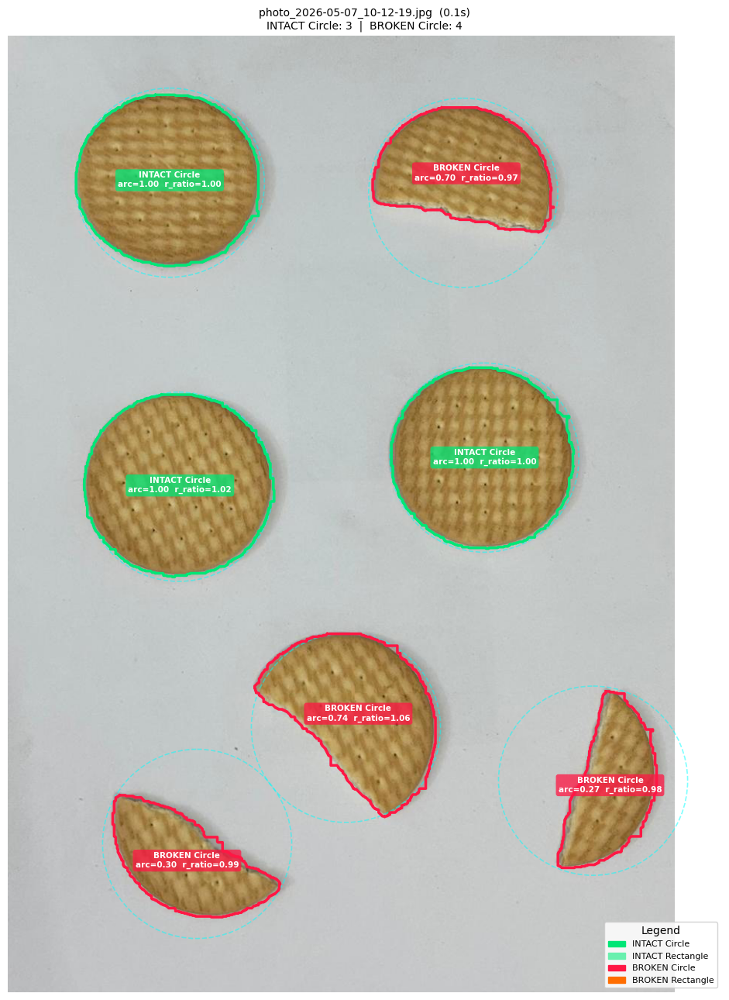


[photo_2026-05-07_10-12-21.jpg]  bench_r=128.8  bench_area=52128  has_circles=True  has_rects=False
  INTACT Circle     af=1.000  sol=0.971  r_ratio=1.076  size=1.16
  INTACT Circle     af=1.000  sol=0.975  r_ratio=0.993  size=0.99
  INTACT Circle     af=1.000  sol=0.981  r_ratio=1.000  size=1.00
  BROKEN Circle     af=0.722  sol=0.945  r_ratio=1.110  size=1.23
  BROKEN Circle     af=0.699  sol=0.953  r_ratio=0.967  size=0.94
  BROKEN Circle     af=0.310  sol=0.927  r_ratio=0.974  size=0.95
  BROKEN Circle     af=0.323  sol=0.939  r_ratio=0.953  size=0.91


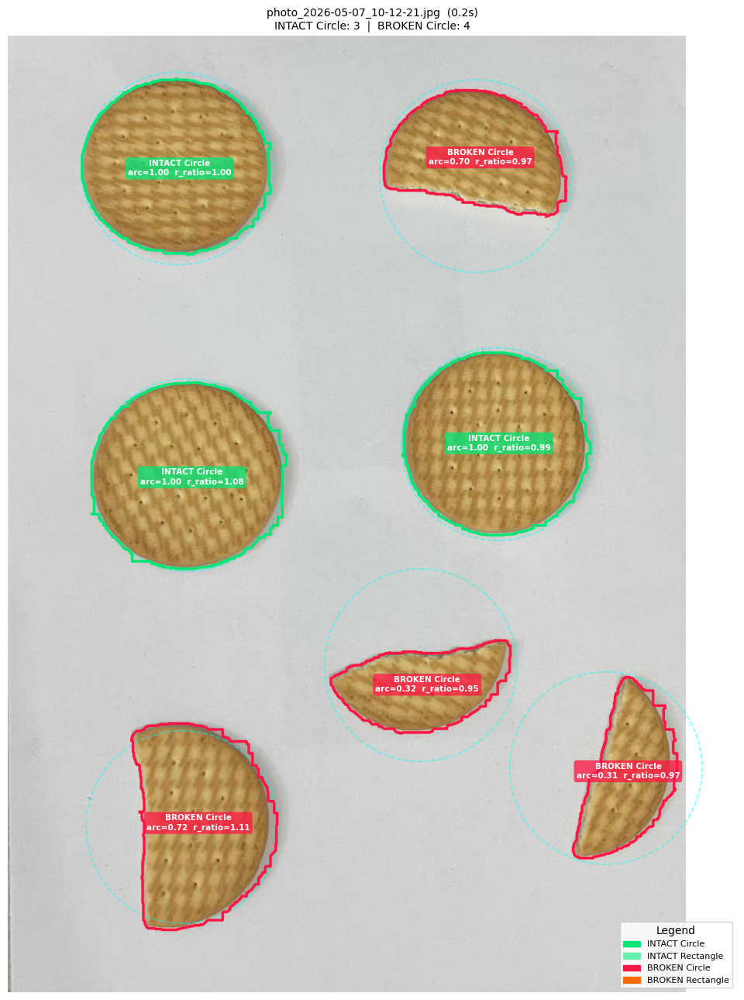


[photo_2026-05-07_10-12-23.jpg]  bench_r=128.8  bench_area=52128  has_circles=True  has_rects=False
  INTACT Circle     af=1.000  sol=0.971  r_ratio=1.076  size=1.16
  INTACT Circle     af=1.000  sol=0.975  r_ratio=0.993  size=0.99
  INTACT Circle     af=1.000  sol=0.981  r_ratio=1.000  size=1.00
  BROKEN Circle     af=0.722  sol=0.945  r_ratio=1.110  size=1.23
  BROKEN Circle     af=0.699  sol=0.953  r_ratio=0.967  size=0.94
  BROKEN Circle     af=0.310  sol=0.927  r_ratio=0.974  size=0.95
  BROKEN Circle     af=0.323  sol=0.939  r_ratio=0.953  size=0.91


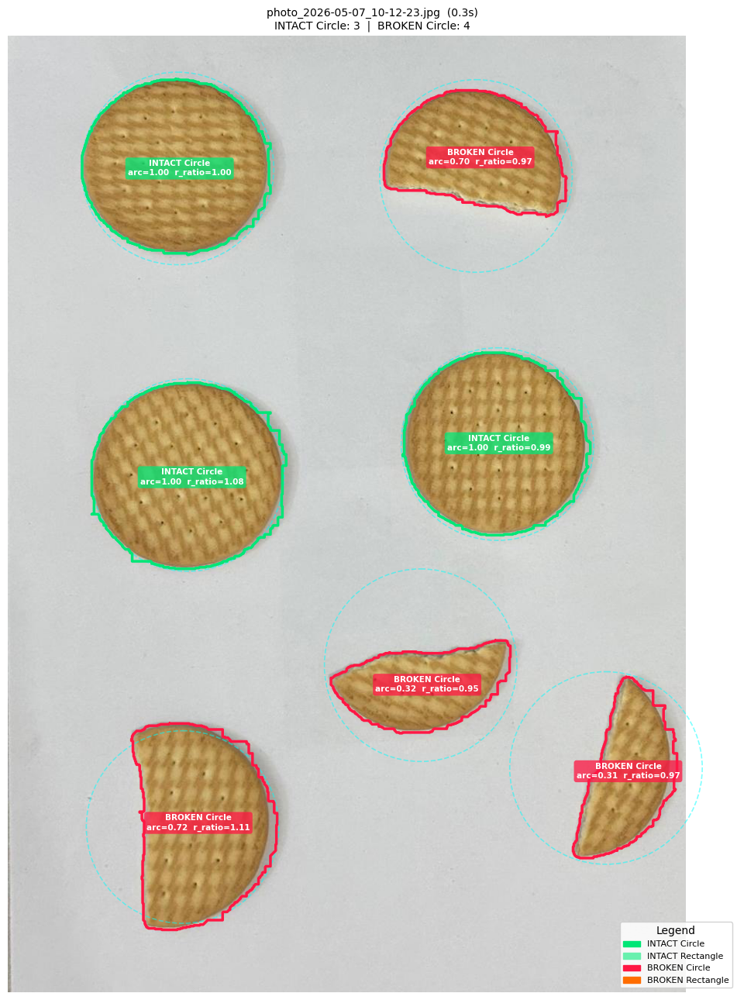


[photo_2026-05-07_10-12-24.jpg]  bench_r=140.0  bench_area=61564  has_circles=True  has_rects=False
  INTACT Circle     af=1.000  sol=0.976  r_ratio=1.040  size=1.08
  INTACT Circle     af=1.000  sol=0.976  r_ratio=1.000  size=1.00
  INTACT Circle     af=1.000  sol=0.979  r_ratio=0.923  size=0.85
  BROKEN Circle     af=0.721  sol=0.959  r_ratio=0.997  size=0.99
  BROKEN Circle     af=0.719  sol=0.931  r_ratio=0.960  size=0.92
  BROKEN Circle     af=0.332  sol=0.897  r_ratio=0.957  size=0.92
  BROKEN Circle     af=0.250  sol=0.902  r_ratio=0.887  size=0.79


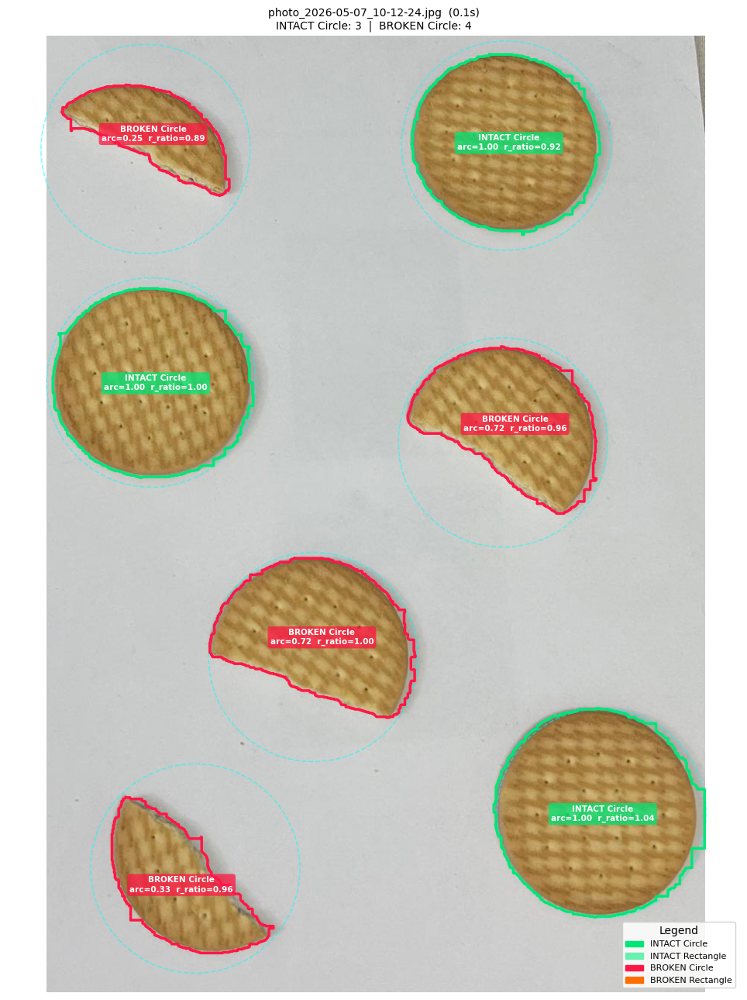


[photo_2026-05-07_10-12-25.jpg]  bench_r=137.0  bench_area=58985  has_circles=True  has_rects=False
  INTACT Circle     af=1.000  sol=0.965  r_ratio=1.053  size=1.11
  INTACT Circle     af=1.000  sol=0.970  r_ratio=1.000  size=1.00
  INTACT Circle     af=1.000  sol=0.970  r_ratio=0.947  size=0.90
  BROKEN Circle     af=0.664  sol=0.938  r_ratio=0.961  size=0.92
  BROKEN Circle     af=0.719  sol=0.935  r_ratio=0.953  size=0.91
  BROKEN Circle     af=0.317  sol=0.925  r_ratio=0.947  size=0.90
  BROKEN Circle     af=0.335  sol=0.926  r_ratio=0.930  size=0.86


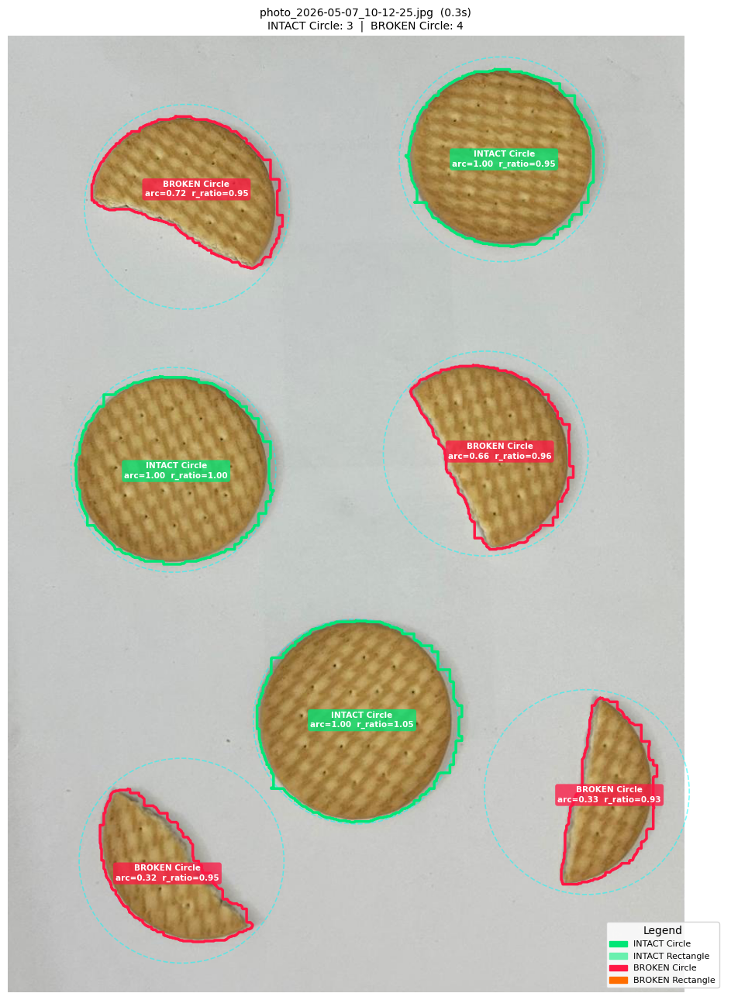


[photo_2026-05-07_10-12-27.jpg]  bench_r=241.9  bench_area=128155  has_circles=False  has_rects=True
  BROKEN Rectangle  af=0.435  sol=0.964  r_ratio=1.000  size=1.00  perp=0.54
  INTACT Rectangle  af=0.386  sol=0.959  r_ratio=0.914  size=0.80  perp=0.58
  BROKEN Rectangle  af=0.279  sol=0.914  r_ratio=0.764  size=0.39  perp=0.00
  BROKEN Rectangle  af=0.428  sol=0.909  r_ratio=0.668  size=0.32  perp=0.71
  BROKEN Rectangle  af=0.394  sol=0.908  r_ratio=0.596  size=0.30  perp=0.75
  BROKEN Rectangle  af=0.345  sol=0.916  r_ratio=0.533  size=0.23  perp=0.95


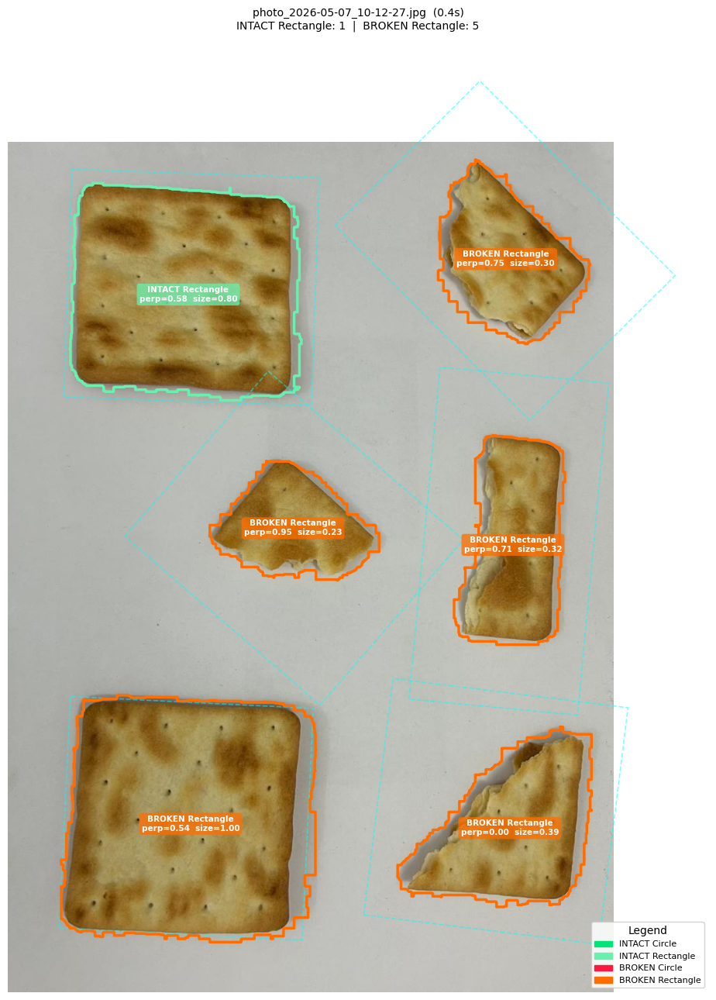


[photo_2026-05-07_10-12-28.jpg]  bench_r=134.4  bench_area=36788  has_circles=True  has_rects=True
  INTACT Circle     af=1.000  sol=0.979  r_ratio=1.029  size=1.06
  INTACT Circle     af=1.000  sol=0.978  r_ratio=1.000  size=1.00
  INTACT Circle     af=1.000  sol=0.980  r_ratio=0.991  size=0.98
  BROKEN Circle     af=0.739  sol=0.935  r_ratio=1.106  size=1.22
  BROKEN Circle     af=0.701  sol=0.971  r_ratio=1.019  size=1.04
  BROKEN Circle     af=0.316  sol=0.951  r_ratio=1.004  size=1.01
  BROKEN Circle     af=0.283  sol=0.929  r_ratio=0.979  size=0.96


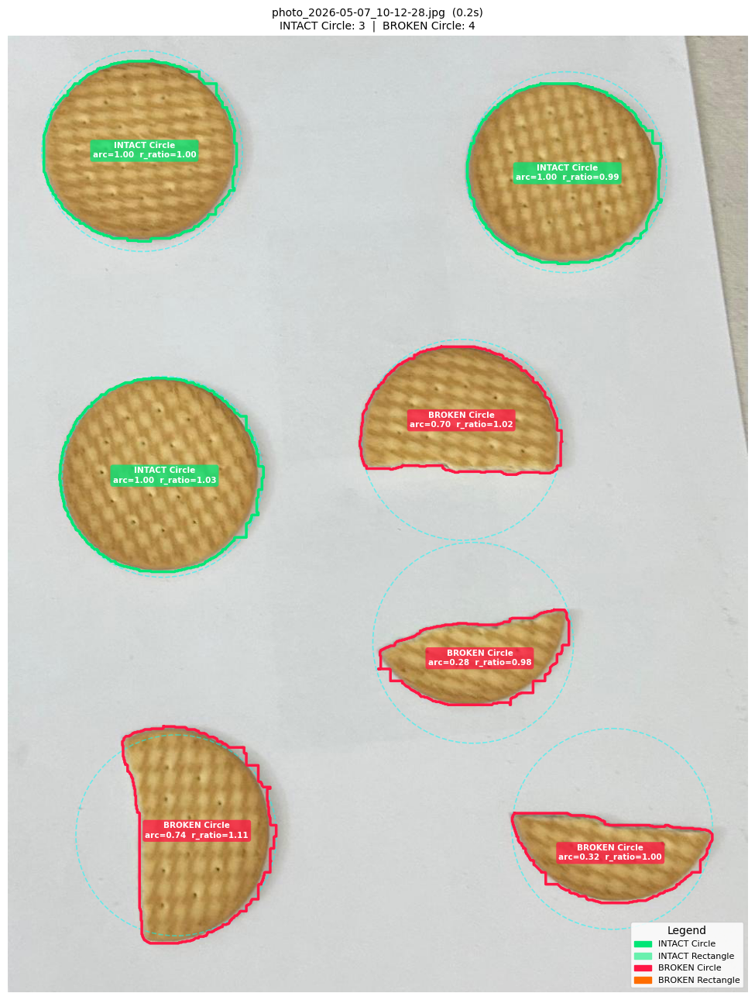


[photo_2026-05-07_10-12-29.jpg]  bench_r=235.5  bench_area=97002  has_circles=False  has_rects=True
  INTACT Rectangle  af=0.431  sol=0.950  r_ratio=1.000  size=1.24  perp=0.93
  BROKEN Rectangle  af=0.395  sol=0.970  r_ratio=0.909  size=1.00  perp=0.40
  BROKEN Rectangle  af=0.317  sol=0.934  r_ratio=0.762  size=0.50  perp=0.76
  BROKEN Rectangle  af=0.437  sol=0.892  r_ratio=0.699  size=0.40  perp=0.22
  BROKEN Rectangle  af=0.389  sol=0.923  r_ratio=0.593  size=0.38  perp=0.40
  BROKEN Rectangle  af=0.377  sol=0.913  r_ratio=0.511  size=0.29  perp=0.57


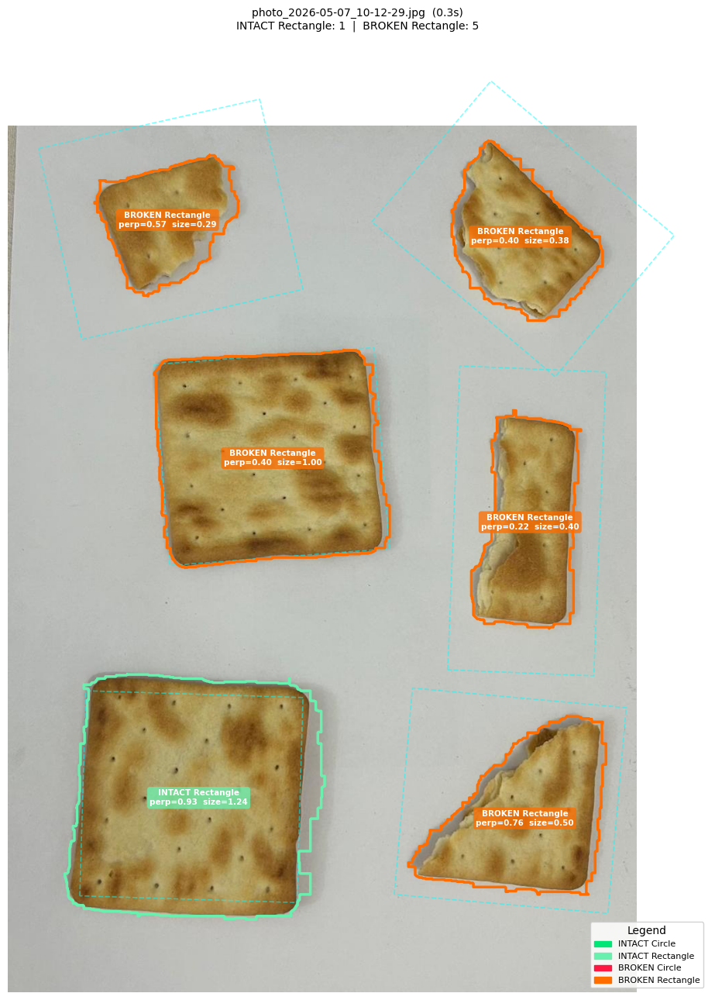


[photo_2026-05-07_10-12-31.jpg]  bench_r=212.4  bench_area=95352  has_circles=False  has_rects=True
  INTACT Rectangle  af=0.378  sol=0.982  r_ratio=1.000  size=1.00  perp=0.97
  INTACT Rectangle  af=0.409  sol=0.958  r_ratio=0.962  size=0.94  perp=0.87
  BROKEN Rectangle  af=0.450  sol=0.952  r_ratio=0.703  size=0.44  perp=0.51
  BROKEN Rectangle  af=0.421  sol=0.881  r_ratio=0.789  size=0.43  perp=0.27
  BROKEN Rectangle  af=0.344  sol=0.944  r_ratio=0.762  size=0.41  perp=0.45
  BROKEN Rectangle  af=0.314  sol=0.905  r_ratio=0.627  size=0.32  perp=0.54


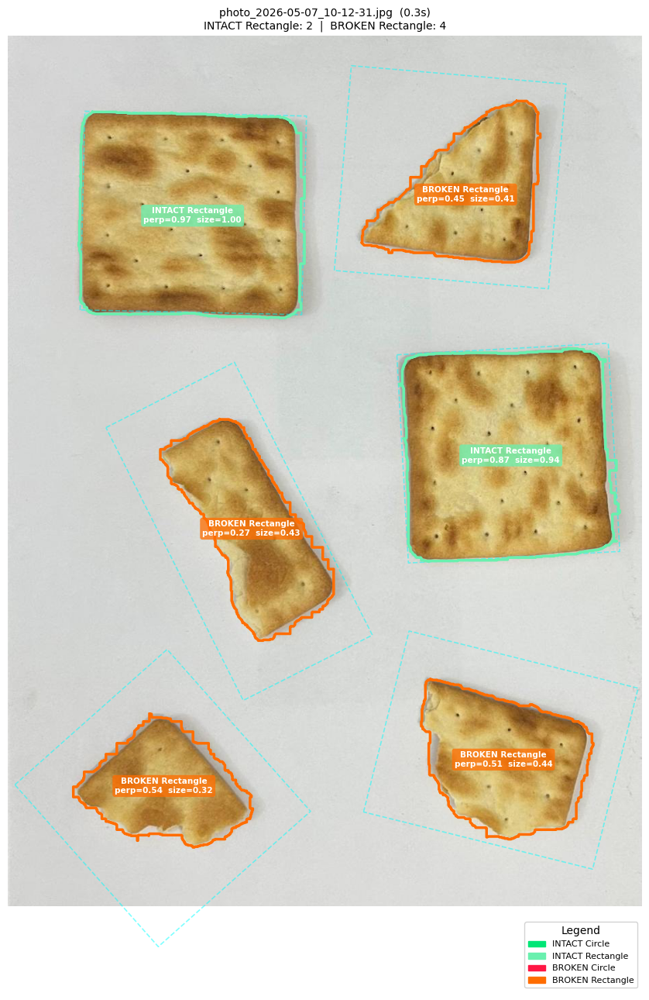


[photo_2026-05-07_10-12-32.jpg]  bench_r=225.4  bench_area=98938  has_circles=False  has_rects=True
  INTACT Rectangle  af=0.405  sol=0.971  r_ratio=1.000  size=1.11  perp=0.66
  INTACT Rectangle  af=0.344  sol=0.972  r_ratio=0.923  size=0.89  perp=0.75
  BROKEN Rectangle  af=0.301  sol=0.933  r_ratio=0.859  size=0.52  perp=0.83
  BROKEN Rectangle  af=0.356  sol=0.940  r_ratio=0.717  size=0.47  perp=0.29
  BROKEN Rectangle  af=0.417  sol=0.901  r_ratio=0.707  size=0.41  perp=0.87
  BROKEN Rectangle  af=0.319  sol=0.925  r_ratio=0.548  size=0.26  perp=0.64


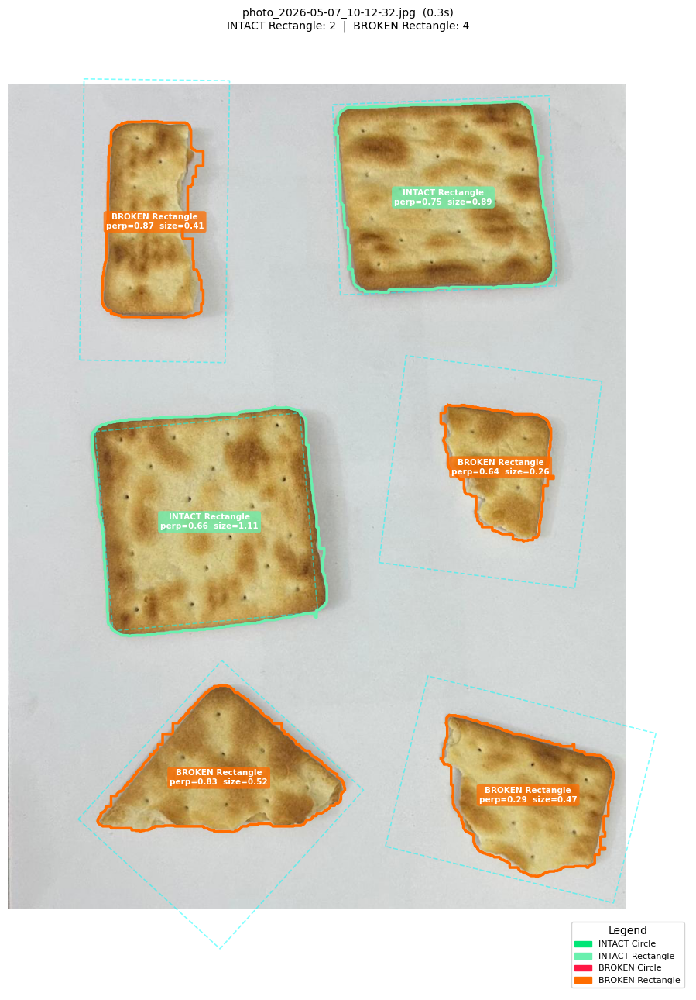


[photo_2026-05-07_10-12-33.jpg]  bench_r=129.4  bench_area=52575  has_circles=True  has_rects=False
  INTACT Circle     af=1.000  sol=0.984  r_ratio=1.014  size=1.03
  INTACT Circle     af=1.000  sol=0.986  r_ratio=1.000  size=1.00
  INTACT Circle     af=1.000  sol=0.979  r_ratio=0.984  size=0.97
  BROKEN Circle     af=0.721  sol=0.945  r_ratio=1.116  size=1.25
  BROKEN Circle     af=0.685  sol=0.959  r_ratio=1.060  size=1.12
  BROKEN Circle     af=0.328  sol=0.931  r_ratio=1.001  size=1.00
  BROKEN Circle     af=0.344  sol=0.951  r_ratio=0.966  size=0.93


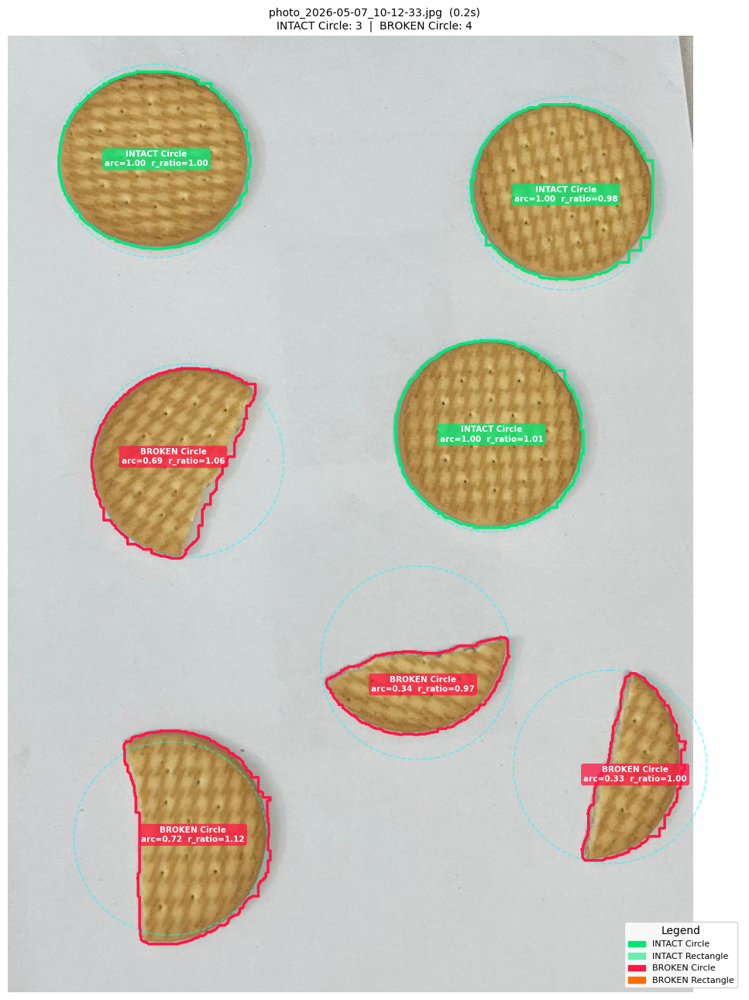


[photo_2026-05-07_10-12-35.jpg]  bench_r=210.4  bench_area=92561  has_circles=False  has_rects=True
  INTACT Rectangle  af=0.374  sol=0.975  r_ratio=1.000  size=1.00  perp=0.76
  INTACT Rectangle  af=0.401  sol=0.955  r_ratio=0.959  size=0.95  perp=0.84
  BROKEN Rectangle  af=0.292  sol=0.921  r_ratio=0.823  size=0.47  perp=0.39
  BROKEN Rectangle  af=0.410  sol=0.860  r_ratio=0.799  size=0.44  perp=0.17
  BROKEN Rectangle  af=0.388  sol=0.927  r_ratio=0.665  size=0.39  perp=0.88
  BROKEN Rectangle  af=0.357  sol=0.920  r_ratio=0.645  size=0.34  perp=0.38


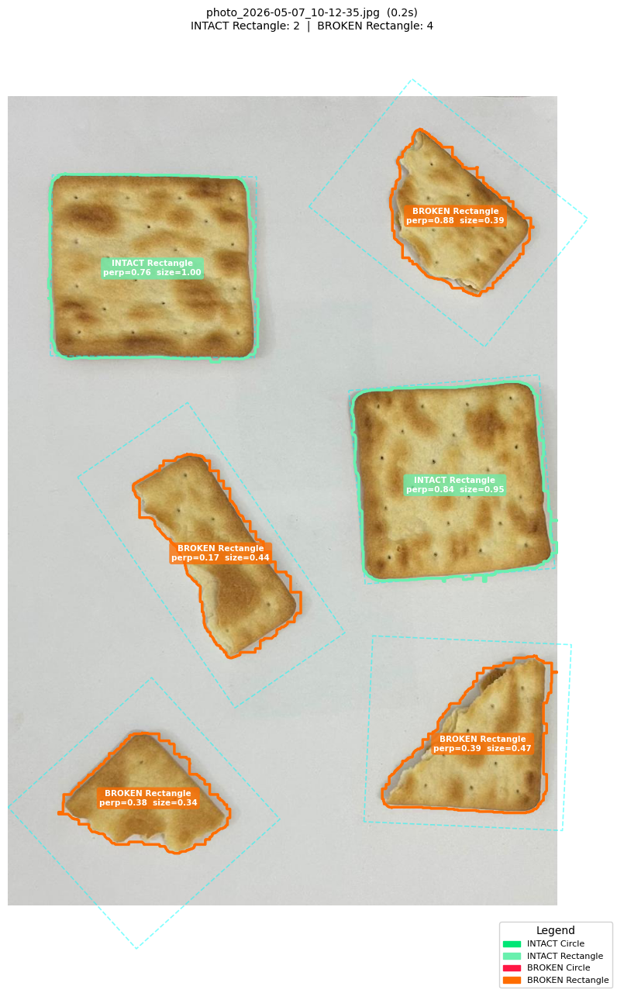


[photo_2026-05-07_10-12-36.jpg]  bench_r=213.9  bench_area=92296  has_circles=False  has_rects=True
  INTACT Rectangle  af=0.370  sol=0.976  r_ratio=1.000  size=1.04  perp=0.99
  INTACT Rectangle  af=0.372  sol=0.980  r_ratio=0.961  size=0.96  perp=0.57
  BROKEN Rectangle  af=0.311  sol=0.952  r_ratio=0.848  size=0.51  perp=0.95
  BROKEN Rectangle  af=0.422  sol=0.951  r_ratio=0.739  size=0.51  perp=0.46
  BROKEN Rectangle  af=0.418  sol=0.916  r_ratio=0.749  size=0.44  perp=0.52
  BROKEN Rectangle  af=0.267  sol=0.929  r_ratio=0.651  size=0.36  perp=0.77


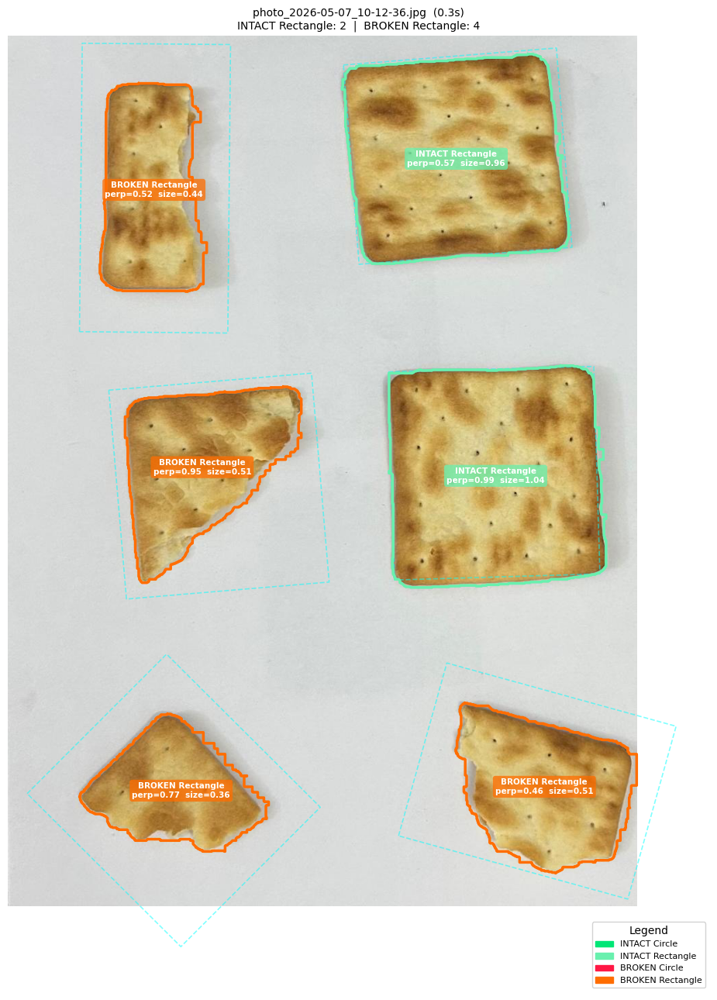


[photo_2026-05-07_10-12-38.jpg]  bench_r=222.9  bench_area=100370  has_circles=False  has_rects=True
  BROKEN Rectangle  af=0.362  sol=0.966  r_ratio=1.000  size=1.02  perp=0.49
  INTACT Rectangle  af=0.369  sol=0.970  r_ratio=0.979  size=0.98  perp=0.66
  BROKEN Rectangle  af=0.319  sol=0.932  r_ratio=0.808  size=0.47  perp=0.00
  BROKEN Rectangle  af=0.419  sol=0.895  r_ratio=0.714  size=0.38  perp=0.48
  BROKEN Rectangle  af=0.344  sol=0.928  r_ratio=0.642  size=0.37  perp=0.11
  BROKEN Rectangle  af=0.390  sol=0.904  r_ratio=0.620  size=0.34  perp=0.00


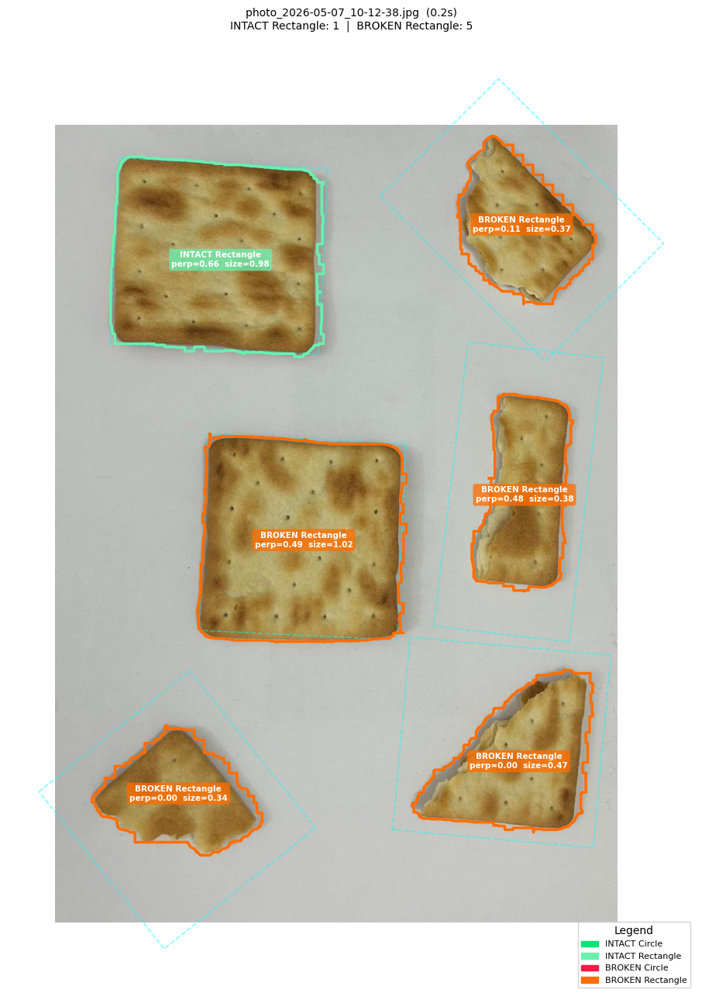

In [7]:
def main():
    img_dir = r"C:\Users\ASUS\Desktop\Semester 7\Image processing\Assignment_2\Images"

    for filename in sorted(os.listdir(img_dir)):
        if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        img = cv2.imread(os.path.join(img_dir, filename))
        if img is None:
            continue

        t0      = time.time()
        pmask   = get_paper_mask(img)
        bmask   = get_biscuit_mask(img, pmask)
        cnts, _ = cv2.findContours(bmask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        blobs   = sorted(
            [(cv2.contourArea(c), c) for c in cnts if cv2.contourArea(c) >= MIN_BLOB_AREA],
            reverse=True)

        bench_r, bench_area, has_circles, has_rects = compute_benchmarks(blobs)
        print(f"\n[{filename}]  bench_r={bench_r:.1f}  bench_area={bench_area:.0f}  "
              f"has_circles={has_circles}  has_rects={has_rects}")

        fig, ax = plt.subplots(figsize=(11, 13))
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        counts = {k: 0 for k in COLORS}

        for area, cnt in blobs:
            shape, state, m = classify(cnt, bench_r, bench_area,
                                       has_circles, has_rects, img.shape)
            draw_ghost(ax, cnt, shape, bench_r, bench_area)
            annotate(ax, cnt, shape, state, m)
            counts[(state, shape)] += 1
            pr = m['perp_ratio']
            print(f"  {state:6} {shape:9}  af={m['af']:.3f}  sol={m['sol']:.3f}  "
                  f"r_ratio={m['r_ratio']:.3f}  size={m['size']:.2f}"
                  + (f"  perp={pr:.2f}" if pr is not None else ""))

        legend = [mpatches.Patch(color=v, label=f"{s} {sh}")
                  for (s, sh), v in COLORS.items()]
        ax.legend(handles=legend, loc='lower right', fontsize=8,
                  framealpha=0.85, title="Legend")
        summary = "  |  ".join(f"{s} {sh}: {n}"
                               for (s, sh), n in counts.items() if n > 0)
        plt.title(f"{filename}  ({time.time()-t0:.1f}s)\n{summary}", fontsize=10)
        plt.axis('off')
        plt.tight_layout()
        plt.show()


if __name__ == "__main__":
    main()